In [1]:
import os

import numpy as np
import pandas as pd

In [2]:
import torch
import torchvision
import cv2

from glob import glob
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torchvision.utils import make_grid

from nets import SimpleSegmentationNet
from data import CityscapesDataset
from labels import labels

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [4]:
# Print the current process ID
print("Current Process ID:", os.getpid())

Current Process ID: 342836


In [5]:
# file_paths = glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/train/bremen/**/*', recursive=True)
train_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/train/bremen/*labelIds.png'))
train_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/train/bremen/*.png'))

val_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/val/frankfurt/*labelIds.png'))
val_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/*.png'))

test_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/test/berlin/*labelIds.png'))
test_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/test/berlin/*.png'))

In [6]:
## Look at object detection

path = glob("/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/frankfurt_000000_000294*.png")[0]
img = plt.imread(path)
print(img)


[[[0.32156864 0.38039216 0.23137255]
  [0.3254902  0.38431373 0.23529412]
  [0.32941177 0.3882353  0.24313726]
  ...
  [0.38431373 0.5254902  0.41960785]
  [0.41568628 0.49019608 0.38039216]
  [0.39215687 0.22745098 0.        ]]

 [[0.69411767 0.7137255  0.5803922 ]
  [0.6784314  0.7019608  0.5647059 ]
  [0.6627451  0.6862745  0.5529412 ]
  ...
  [0.38431373 0.52156866 0.41568628]
  [0.41960785 0.49019608 0.38039216]
  [0.39215687 0.23137255 0.        ]]

 [[0.627451   0.65882355 0.4745098 ]
  [0.61960787 0.64705884 0.46666667]
  [0.60784316 0.6392157  0.4627451 ]
  ...
  [0.38431373 0.5176471  0.4117647 ]
  [0.42352942 0.49019608 0.38039216]
  [0.39215687 0.23921569 0.00784314]]

 ...

 [[0.33333334 0.40392157 0.37254903]
  [0.34509805 0.40784314 0.37254903]
  [0.36078432 0.41960785 0.38431373]
  ...
  [0.32941177 0.39607844 0.35686275]
  [0.32941177 0.39607844 0.35686275]
  [0.3254902  0.39607844 0.35686275]]

 [[0.33333334 0.40392157 0.37254903]
  [0.34509805 0.40784314 0.37254903]


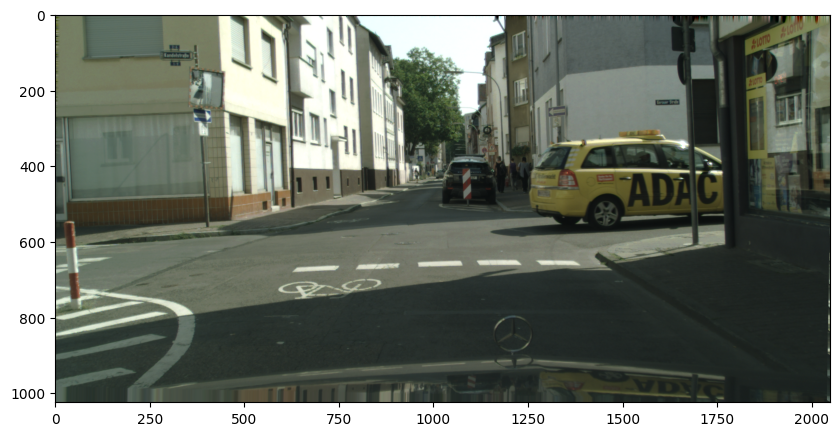

In [7]:
fig,ax = plt.subplots(figsize=(10,30))
ax.imshow(img)
plt.show()

## Network

In [8]:
import torch

# Model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")  # or yolov5n - yolov5x6, custom

Using cache found in /cluster/home/bendikgh/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-11-15 Python-3.8.18 torch-2.1.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


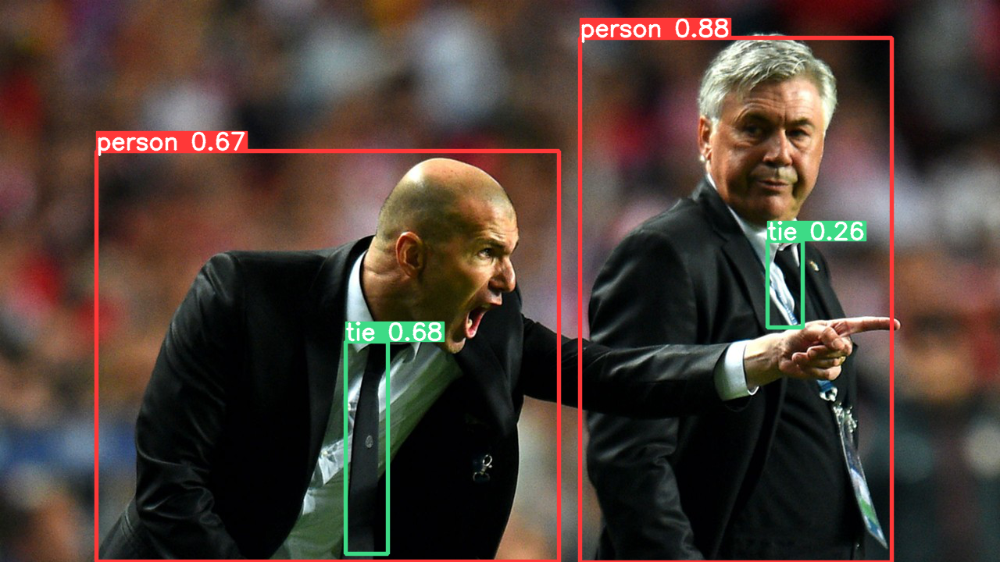

In [9]:
# Images
img = "https://ultralytics.com/images/zidane.jpg"  # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img)

# Results
results.show()  # or .show(), .save(), .crop(), .pandas(), etc.

## Transforming data for inference

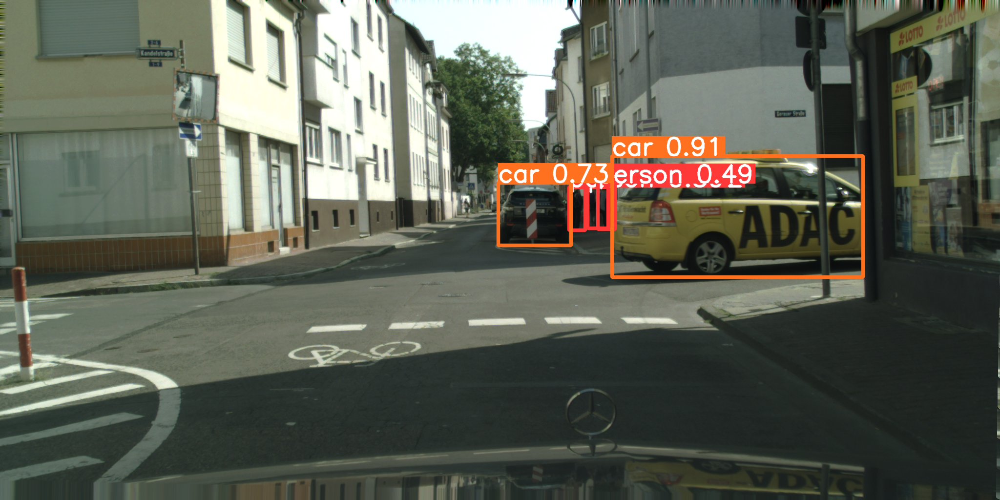

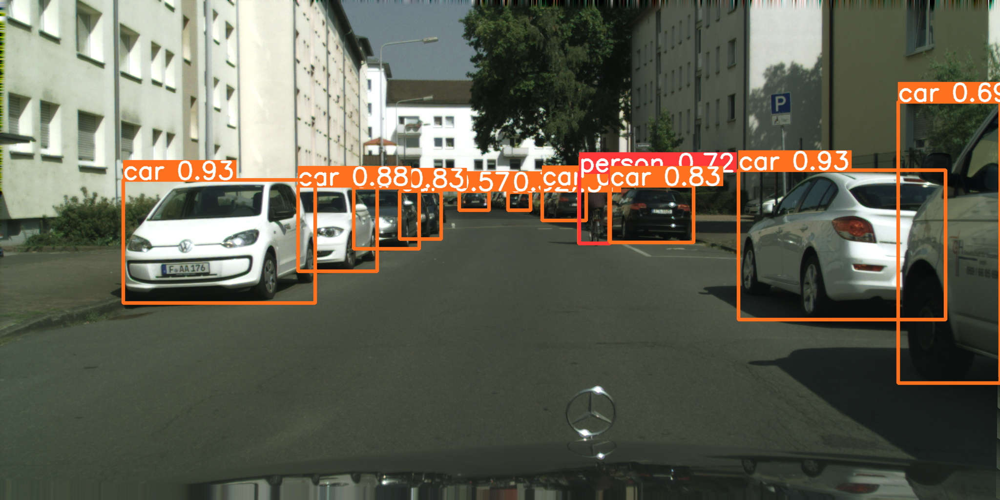

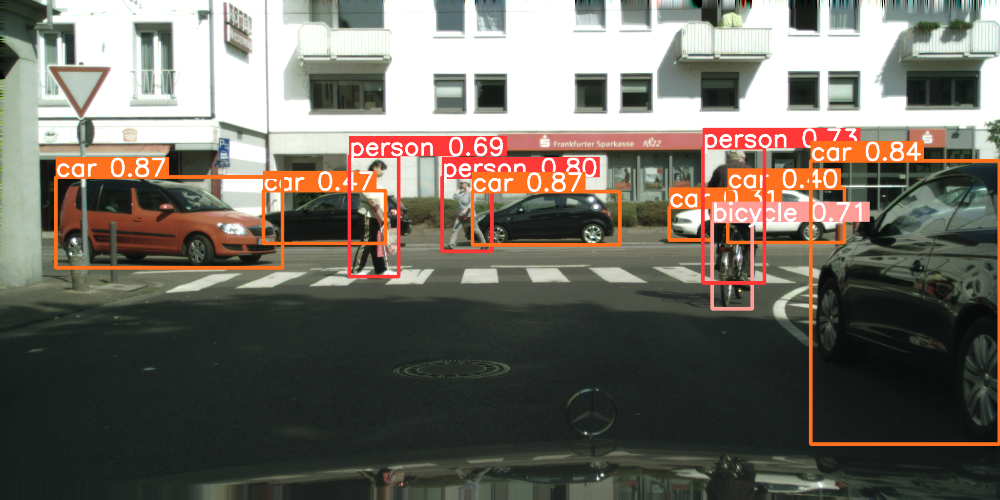

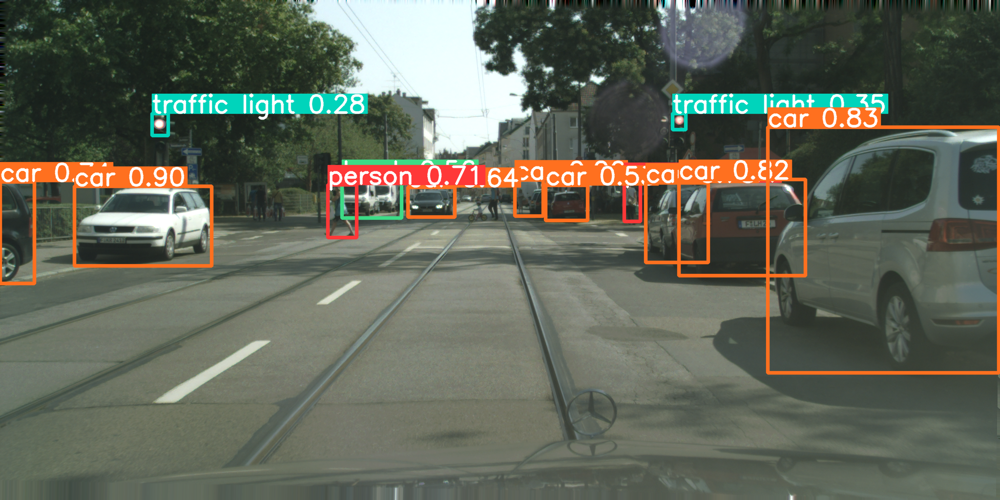

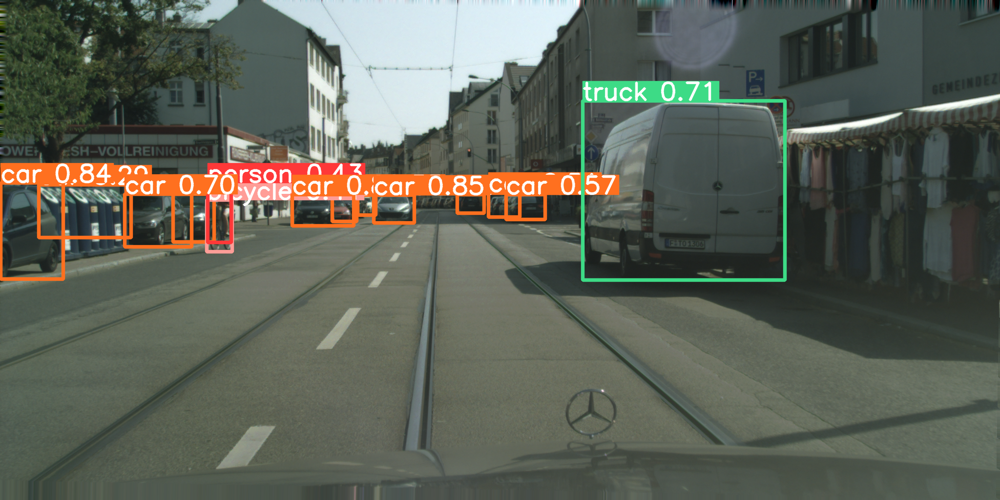

In [10]:
# Choose one city
val_seg_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/gtFine_trainvaltest/gtFine/val/frankfurt/*labelIds.png'))
val_img_path = sorted(glob('/cluster/projects/vc/data/ad/open/Cityscapes/leftImg8bit_trainvaltest/leftImg8bit/val/frankfurt/*.png'))

# Create yaml-file

# Make a folder of images

# Create txt-files

# run inference on validation set

n = 0
for path in val_img_path:
    n += 1
    results = model(path)
    results.show()
    if n > 4:
        break

# Calculate loss for inferences??